<a href="https://colab.research.google.com/github/lifesboy/selks-lstm-data/blob/main/SELKS_LSTM_Anomaly_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1.LSTM KERAS

docs lib: https://keras.io/api/layers/recurrent_layers/lstm/

# 2.PREPARATION

In [1]:
#@title Check version vs GPU
!git --version
!python --version
!ray --version

import tensorflow as tf
print('tf version: ', tf.__version__)
print('tf.keras version:', tf.keras.__version__)

import sys
sys.version

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print('GPU device not found')
else:
  print('Found GPU at: {}'.format(device_name))

git version 2.20.1
Python 2.7.16
ray, version 1.13.0
tf version:  2.7.0
tf.keras version: 2.7.0
Found GPU at: /device:GPU:0


2023-01-27 14:45:51.731786: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-27 14:45:53.846537: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:0 with 13348 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-01-27 14:45:53.848256: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:1 with 13348 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-01-27 14:45:53.849754: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /device:GPU:2 with 13348 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capabilit

In [2]:
#@title Import Libraries
!mkdir -p /cic/images/

import sys
sys.path.insert(0, "/usr/local/opnsense/scripts/ml")

import json
import ray
import pyarrow
import pyarrow as pa
from pyarrow import csv
from pandas import DataFrame

from ray.data import Dataset
from ray.data.aggregate import Count

import numpy as np
from numpy import array
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Bidirectional
from tensorflow.keras import Input


import common
from anomaly_normalization import PS, LABEL, PAYLOAD_FEATURE_NUM, ALL_FEATURES
from aimodels.preprocessing.cicflowmeter_norm_model import CicFlowmeterNormModel
from aitests.testutils import show_scattered_4d, show_weights, show_4d_imgs, show_train_metric, IMG,\
read_csv_in_dir, read_csv_in_dir_label_string

run, client = common.init_experiment(name='notebook')


2023-01-27 14:45:56,593[INFO][140648981464896-MainThread] worker.py:init(957) Connecting to existing Ray cluster at address: 172.18.12.180:6379


# 3.INPUT
Let's generate a sample input with time dimension as below:

In [3]:
#@title Generate an input sequence
#10.0.2.10
#10.0.2.155
#10.0.2.180
#10.0.2.181
#10.0.2.182
#192.168.66.39
#192.168.66.21

cell_size = 320 #@param {type:"integer"} #numberOfLSTMunits
hidden_size = 230 #@param {type:"integer"}
n_timesteps_in = 100  #@param {type:"integer"}
n_features = 79   #@param {type:"integer"}

# generate datasets
train_size= 170 #@param {type:"integer"}
test_size = 160  #@param {type:"integer"}
batch_size=32 #@param {type:"integer"}
epochs=100 #@param {type:"integer"}

L_fsource = '/cic/dataset/featured_extracted/ssh-bruteforce-forward-https-label/' #@param {type:"string"}
L_fdata: Dataset = read_csv_in_dir_label_string(L_fsource)
L_fcount: DataFrame = L_fdata.groupby(LABEL).aggregate(Count()).to_pandas()

features = ['ack_flag_cnt', 'active_max', 'active_mean', 'active_min', 'active_std', 'bwd_blk_rate_avg', 'bwd_byts_b_avg', 'bwd_header_len', 'bwd_iat_max', 'bwd_iat_mean', 'bwd_iat_min', 'bwd_iat_std', 'bwd_iat_tot', 'bwd_pkt_len_max', 'bwd_pkt_len_mean', 'bwd_pkt_len_min', 'bwd_pkt_len_std', 'bwd_pkts_b_avg', 'bwd_pkts_s', 'bwd_psh_flags', 'bwd_seg_size_avg', 'bwd_urg_flags', 'cwe_flag_count', 'down_up_ratio', 'dst_port', 'ece_flag_cnt', 'fin_flag_cnt', 'flow_byts_s', 'flow_duration', 'flow_iat_max', 'flow_iat_mean', 'flow_iat_min', 'flow_iat_std', 'flow_pkts_s', 'fwd_act_data_pkts', 'fwd_blk_rate_avg', 'fwd_byts_b_avg', 'fwd_header_len', 'fwd_iat_max', 'fwd_iat_mean', 'fwd_iat_min', 'fwd_iat_std', 'fwd_iat_tot', 'fwd_pkt_len_max', 'fwd_pkt_len_mean', 'fwd_pkt_len_min', 'fwd_pkt_len_std', 'fwd_pkts_b_avg', 'fwd_pkts_s', 'fwd_psh_flags', 'fwd_seg_size_avg', 'fwd_seg_size_min', 'fwd_urg_flags', 'idle_max', 'idle_mean', 'idle_min', 'idle_std', 'init_bwd_win_byts', 'init_fwd_win_byts', 'pkt_len_max', 'pkt_len_mean', 'pkt_len_min', 'pkt_len_std', 'pkt_len_var', 'pkt_size_avg', 'protocol', 'psh_flag_cnt', 'rst_flag_cnt', 'src_port', 'subflow_bwd_byts', 'subflow_bwd_pkts', 'subflow_fwd_byts', 'subflow_fwd_pkts', 'syn_flag_cnt', 'tot_bwd_pkts', 'tot_fwd_pkts', 'totlen_bwd_pkts', 'totlen_fwd_pkts', 'urg_flag_cnt']
#features = [*features, *[PS % i for i in range(0, PAYLOAD_FEATURE_NUM)]]
features = features[0: n_features]
Lfpadding_features = sorted(list(set(features) - set(L_fdata.schema(fetch_if_missing=True).names)))

print ('features=', features)
print ('Lfpadding_features=', Lfpadding_features)

L_ftrain = DataFrame.from_records(L_fdata.take(train_size * n_timesteps_in)).fillna(0).replace([np.inf, -np.inf], 0)
L_ftrain[Lfpadding_features] = 0
#L_ftrain[LABEL] = L_ftrain.apply(lambda x: 'Anomaly' if x['src_ip'] == '192.168.66.39' else 'Benign', axis=1)
L_ftrain[LABEL] = L_ftrain[LABEL].apply(lambda x: 0 if x in ['Benign', ''] else 1)
LX_ftrain = L_ftrain[features].to_numpy().reshape(train_size, n_timesteps_in, n_features)
Ly_ftrain = L_ftrain[[LABEL]].to_numpy().reshape(train_size, n_timesteps_in)

L_ftest = DataFrame.from_records(L_fdata.take(test_size * n_timesteps_in)).fillna(0).replace([np.inf, -np.inf], 0)
L_ftest[Lfpadding_features] = 0
#L_ftest[LABEL] = L_ftest.apply(lambda x: 'Anomaly' if x['src_ip'] == '192.168.66.39' else 'Benign', axis=1)
L_ftest[LABEL] = L_ftest[LABEL].apply(lambda x: 0 if x in ['Benign', ''] else 1)
LX_ftest = L_ftest[features].to_numpy().reshape(test_size, n_timesteps_in, n_features)
Ly_ftest = L_ftest[[LABEL]].to_numpy().reshape(test_size, n_timesteps_in)

Shuffle Reduce: 100%|██████████| 1/1 [00:00<00:00, 104.93it/s]


features= ['ack_flag_cnt', 'active_max', 'active_mean', 'active_min', 'active_std', 'bwd_blk_rate_avg', 'bwd_byts_b_avg', 'bwd_header_len', 'bwd_iat_max', 'bwd_iat_mean', 'bwd_iat_min', 'bwd_iat_std', 'bwd_iat_tot', 'bwd_pkt_len_max', 'bwd_pkt_len_mean', 'bwd_pkt_len_min', 'bwd_pkt_len_std', 'bwd_pkts_b_avg', 'bwd_pkts_s', 'bwd_psh_flags', 'bwd_seg_size_avg', 'bwd_urg_flags', 'cwe_flag_count', 'down_up_ratio', 'dst_port', 'ece_flag_cnt', 'fin_flag_cnt', 'flow_byts_s', 'flow_duration', 'flow_iat_max', 'flow_iat_mean', 'flow_iat_min', 'flow_iat_std', 'flow_pkts_s', 'fwd_act_data_pkts', 'fwd_blk_rate_avg', 'fwd_byts_b_avg', 'fwd_header_len', 'fwd_iat_max', 'fwd_iat_mean', 'fwd_iat_min', 'fwd_iat_std', 'fwd_iat_tot', 'fwd_pkt_len_max', 'fwd_pkt_len_mean', 'fwd_pkt_len_min', 'fwd_pkt_len_std', 'fwd_pkts_b_avg', 'fwd_pkts_s', 'fwd_psh_flags', 'fwd_seg_size_avg', 'fwd_seg_size_min', 'fwd_urg_flags', 'idle_max', 'idle_mean', 'idle_min', 'idle_std', 'init_bwd_win_byts', 'init_fwd_win_byts', 'pk

In [4]:
L_fcount

,label,count()
0,,34410
1,SSH-Bruteforce,78


## Data preview

### L_ftrain preview

In [5]:
L_ftrain[[LABEL, *features]]

,label,ack_flag_cnt,active_max,active_mean,active_min,active_std,bwd_blk_rate_avg,bwd_byts_b_avg,bwd_header_len,bwd_iat_max,bwd_iat_mean,bwd_iat_min,bwd_iat_std,bwd_iat_tot,bwd_pkt_len_max,bwd_pkt_len_mean,bwd_pkt_len_min,bwd_pkt_len_std,bwd_pkts_b_avg,bwd_pkts_s,bwd_psh_flags,bwd_seg_size_avg,bwd_urg_flags,cwe_flag_count,down_up_ratio,dst_port,ece_flag_cnt,fin_flag_cnt,flow_byts_s,flow_duration,flow_iat_max,flow_iat_mean,flow_iat_min,flow_iat_std,flow_pkts_s,fwd_act_data_pkts,fwd_blk_rate_avg,fwd_byts_b_avg,fwd_header_len,fwd_iat_max,fwd_iat_mean,fwd_iat_min,fwd_iat_std,fwd_iat_tot,fwd_pkt_len_max,fwd_pkt_len_mean,fwd_pkt_len_min,fwd_pkt_len_std,fwd_pkts_b_avg,fwd_pkts_s,fwd_psh_flags,fwd_seg_size_avg,fwd_seg_size_min,fwd_urg_flags,idle_max,idle_mean,idle_min,idle_std,init_bwd_win_byts,init_fwd_win_byts,pkt_len_max,pkt_len_mean,pkt_len_min,pkt_len_std,pkt_len_var,pkt_size_avg,protocol,psh_flag_cnt,rst_flag_cnt,src_port,subflow_bwd_byts,subflow_bwd_pkts,subflow_fwd_byts,subflow_fwd_pkts,syn_flag_cnt,tot_bwd_pkts,tot_fwd_pkts,totlen_bwd_pkts,totlen_fwd_pkts,urg_flag_cnt
0,0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,16.0,0.0,0.000000,0.0,0.000000,0.0,139.0,139.000000,139.0,0.000000,0.000000,33.549729,0.0,139.000000,0.0,0.0,1.000000,53.0,0.0,0.0,7548.689044,59613.0,38679.0,1.987100e+04,9560.0,1.331987e+04,67.099458,2.0,0.000000e+00,0.000000,16.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,86.0,86.000000,86.0,0.000000,0.000000,33.549729,0.0,86.000000,8.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.0,139.0,112.500000,86.0,26.500000,7.022500e+02,112.500000,17.0,0.0,0.0,52148.0,278.0,2.0,172.0,2.0,0.0,2.0,2.0,278.0,172.0,0.0
1,0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,40.0,0.0,0.000000,0.0,0.000000,0.0,40.0,40.000000,40.0,0.000000,0.000000,59.415941,0.0,40.000000,0.0,0.0,0.500000,443.0,0.0,1.0,9417.426696,33661.0,28431.0,6.732200e+03,7.0,1.093844e+04,178.247824,2.0,0.000000e+00,0.000000,80.0,32288.0,1.122033e+04,65.0,1.490573e+04,33661.0,86.0,59.250000,40.0,19.967161,0.000000,118.831883,0.0,59.250000,20.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,269.0,258.0,86.0,52.833333,40.0,18.658480,3.481389e+02,52.833333,6.0,0.0,0.0,49763.0,80.0,2.0,237.0,4.0,0.0,2.0,4.0,80.0,237.0,0.0
2,0,0.0,0.0,0.0,0.0,0.0,153105.919830,219.714286,16040.0,6936637.0,5333.580838,25.0,155163.844299,10688496.0,1170.0,71.487282,57.0,49.978234,4.047619,187.514911,0.0,71.487282,0.0,0.0,0.336015,56041.0,0.0,1.0,782542.371122,10692483.0,6936637.0,1.341414e+03,-11.0,7.782953e+04,745.570510,5967.0,1.280202e+07,9425.970326,47736.0,6938979.0,1.792237e+03,6.0,8.999535e+04,10692483.0,1385.0,1378.245182,56.0,92.647893,6.977745,558.055598,0.0,1378.245182,8.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.0,1385.0,1049.588685,56.0,573.160012,3.285124e+05,1049.588685,17.0,0.0,0.0,443.0,143332.0,2005.0,8223989.0,5967.0,0.0,2005.0,5967.0,143332.0,8223989.0,0.0
3,0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,443.0,0.0,1.0,44.295577,21311383.0,9604639.0,2.131138e+06,58.0,2.834834e+06,0.516156,9.0,2.093638e+02,189.000000,220.0,9604639.0,2.131138e+06,58.0,2.834834e+06,21311383.0,103.0,85.818182,40.0,24.840649,4.000000,0.516156,0.0,85.818182,20.0,0.0,4810887.0,1.921842e+06,9374.0,1.629878e+06,0.0,258.0,103.0,85.818182,40.0,24.840649,6.170579e+02,85.818182,6.0,0.0,0.0,49713.0,0.0,0.0,944.0,11.0,0.0,0.0,11.0,0.0,944.0,0.0
4,0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,16.0,0.0,0.000000,0.0,0.000000,0.0,208.0,208.000000,208.0,0.000000,0.000000,31.907087,0.0,208.000000,0.0,0.0,1.000000,53.0,0.0,0.0,9061.612584,62682.0,29117.0,2.089400e+04,16672.0,5.815239e+03,63.814173,2.0,0.000000e+00,0.000000,16.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,76.0,76.000000,76.0,0.000000,0.000000,31.907087,0.0,76.000000,8.0,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.0,208.0,142.000000,76.0,66.000000,4.356000e+03,142.000000,17.0,0.0,0.0,57846.0,416.0,2.0,152.0,2.0,0.0,2.0,2.0,416.0,152.0,0.0
...,...,...,...,...,...,...,...,...,...,..

In [6]:
L_ftrain[[LABEL, *features]].describe()

,label,ack_flag_cnt,active_max,active_mean,active_min,active_std,bwd_blk_rate_avg,bwd_byts_b_avg,bwd_header_len,bwd_iat_max,bwd_iat_mean,bwd_iat_min,bwd_iat_std,bwd_iat_tot,bwd_pkt_len_max,bwd_pkt_len_mean,bwd_pkt_len_min,bwd_pkt_len_std,bwd_pkts_b_avg,bwd_pkts_s,bwd_psh_flags,bwd_seg_size_avg,bwd_urg_flags,cwe_flag_count,down_up_ratio,dst_port,ece_flag_cnt,fin_flag_cnt,flow_byts_s,flow_duration,flow_iat_max,flow_iat_mean,flow_iat_min,flow_iat_std,flow_pkts_s,fwd_act_data_pkts,fwd_blk_rate_avg,fwd_byts_b_avg,fwd_header_len,fwd_iat_max,fwd_iat_mean,fwd_iat_min,fwd_iat_std,fwd_iat_tot,fwd_pkt_len_max,fwd_pkt_len_mean,fwd_pkt_len_min,fwd_pkt_len_std,fwd_pkts_b_avg,fwd_pkts_s,fwd_psh_flags,fwd_seg_size_avg,fwd_seg_size_min,fwd_urg_flags,idle_max,idle_mean,idle_min,idle_std,init_bwd_win_byts,init_fwd_win_byts,pkt_len_max,pkt_len_mean,pkt_len_min,pkt_len_std,pkt_len_var,pkt_size_avg,protocol,psh_flag_cnt,rst_flag_cnt,src_port,subflow_bwd_byts,subflow_bwd_pkts,subflow_fwd_byts,subflow_fwd_pkts,syn_flag_cnt,tot_bwd_pkts,tot_fwd_pkts,totlen_bwd_pkts,totlen_fwd_pkts,urg_flag_cnt
count,17000.000000,17000.0,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,17000.000000,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.0,17000.000000,17000.0,17000.0,17000.000000,17000.000000,17000.0,17000.000000,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,17000.000000,17000.000000,1.700000e+04,1.700000e+04,17000.000000,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.0,17000.000000,17000.000000,17000.0,1.700000e+04,1.700000e+04,1.700000e+04,1.700000e+04,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,1.700000e+04,17000.000000,17000.000000,17000.0,17000.0,17000.000000,1.700000e+04,17000.000000,1.700000e+04,17000.000000,17000.0,17000.000000,17000.000000,1.700000e+04,1.700000e+04,17000.0
mean,0.002235,0.0,1.734884e+04,9.977132e+03,3.140205e+03,6.189411e+03,9.787587e+05,3.696205e+03,292.256706,1.245607e+06,3.863736e+05,1.359487e+04,4.686042e+05,4.390403e+06,896.128000,350.965845,78.364059,309.381052,1.543344,1428.025180,0.0,350.965845,0.0,0.0,1.203073,8976.481412,0.0,0.736176,2.164341e+05,4.773080e+06,1.413072e+06,2.175960e+05,3.664868e+03,4.422505e+05,2203.155713,6.781118,1.823562e+06,1.754299e+03,233.671765,1.333082e+06,3.640177e+05,7.116065e+03,5.015200e+05,4.569702e+06,2791.801824,750.273414,55.883294,1033.690971,0.171041,775.130534,0.0,750.273414,16.533176,0.0,3.124449e+05,1.619396e+05,5.525592e+04,1.177670e+05,2396.428882,14065.775059,3422.273588,545.033571,52.650941,998.435473,1.194610e+07,545.033571,9.175765,0.0,0.0,49245.877059,1.101083e+04,15.053235,1.596329e+04,12.183000,0.0,15.053235,12.183000,1.101083e+04,1.596329e+04,0.0
std,0.047227,0.0,3.546944e+05,2.030893e+05,6.987997e+04,1.449219e+05,9.857986e+06,4.827613e+04,870.141842,4.999723e+06,2.161438e+06,6.739202e+05,2.216104e+06,1.423080e+07,4759.054879,1878.104763,102.935786,1878.444782,7.327835,4583.775108,0.0,1878.104763,0.0,0.0,0.509932,17226.093927,0.0,0.440718,1.657437e+06,1.510175e+07,5.546885e+06,9.491809e+05,1.105136e+05,1.927227e+06,6923.118635,48.837448,2.710172e+07,2.623376e+04,688.489773,5.466153e+06,1.609605e+06,1.478666e+05,2.283156e+06,1.460964e+07,9281.884771,3044.639231,139.940990,3638.213017,1.284737,2376.288754,0.0,3044.639231,5.440917,0.0,1.776733e+06,9.551627e+05,5.392909e+05,7.081737e+05,8640.404629,25260.020369,10261.731155,1949.078785,136.494531,3309.059441,7.090027e+07,1949.078785,4.984916,0.0,0.0,14628.059774,8.783264e+04,45.764003,1.202623e+05,54.193219,0.0,45.764003,54.193219,8.783264e+04,1.202623e+05,0.0
min,0.000000,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,-1.054390e+05,0.000000e+00,0.000000e+00,0.000000,0.00

In [7]:
DataFrame.from_records(LX_ftrain[0])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000,16.0,0.0,0.000000,0.0,0.000000,0.0,139.0,139.000000,139.0,0.000000,0.000000,33.549729,0.0,139.000000,0.0,0.0,1.000000,53.0,0.0,0.0,7548.689044,59613.0,38679.0,1.987100e+04,9560.0,1.331987e+04,67.099458,2.0,0.000000e+00,0.000000,16.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,86.0,86.000000,86.0,0.000000,0.000000,33.549729,0.0,86.000000,8.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,139.0,112.500000,86.0,26.500000,702.250000,112.500000,17.0,0.0,0.0,52148.0,278.0,2.0,172.0,2.0,0.0,2.0,2.0,278.0,172.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000,40.0,0.0,0.000000,0.0,0.000000,0.0,40.0,40.000000,40.0,0.000000,0.000000,59.415941,0.0,40.000000,0.0,0.0,0.500000,443.0,0.0,1.0,9417.426696,33661.0,28431.0,6.732200e+03,7.0,1.093844e+04,178.247824,2.0,0.000000e+00,0.000000,80.0,32288.0,1.122033e+04,65.0,1.490573e+04,33661.0,86.0,59.250000,40.0,19.967161,0.000000,118.831883,0.0,59.250000,20.0,0.0,0.0,0.0,0.0,0.000000e+00,269.0,258.0,86.0,52.833333,40.0,18.658480,348.138889,52.833333,6.0,0.0,0.0,49763.0,80.0,2.0,237.0,4.0,0.0,2.0,4.0,80.0,237.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.531059e+05,219.714286,16040.0,6936637.0,5333.580838,25.0,155163.844299,10688496.0,1170.0,71.487282,57.0,49.978234,4.047619,187.514911,0.0,71.487282,0.0,0.0,0.336015,56041.0,0.0,1.0,782542.371122,10692483.0,6936637.0,1.341414e+03,-11.0,7.782953e+04,745.570510,5967.0,1.280202e+07,9425.970326,47736.0,6938979.0,1.792237e+03,6.0,8.999535e+04,10692483.0,1385.0,1378.245182,56.0,92.647893,6.977745,558.055598,0.0,1378.245182,8.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,1385.0,1049.588685,56.0,573.160012,328512.399686,1049.588685,17.0,0.0,0.0,443.0,143332.0,2005.0,8223989.0,5967.0,0.0,2005.0,5967.0,143332.0,8223989.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,443.0,0.0,1.0,44.295577,21311383.0,9604639.0,2.131138e+06,58.0,2.834834e+06,0.516156,9.0,2.093638e+02,189.000000,220.0,9604639.0,2.131138e+06,58.0,2.834834e+06,21311383.0,103.0,85.818182,40.0,24.840649,4.000000,0.516156,0.0,85.818182,20.0,0.0,4810887.0,1921841.8,9374.0,1.629878e+06,0.0,258.0,103.0,85.818182,40.0,24.840649,617.057851,85.818182,6.0,0.0,0.0,49713.0,0.0,0.0,944.0,11.0,0.0,0.0,11.0,0.0,944.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000,16.0,0.0,0.000000,0.0,0.000000,0.0,208.0,208.000000,208.0,0.000000,0.000000,31.907087,0.0,208.000000,0.0,0.0,1.000000,53.0,0.0,0.0,9061.612584,62682.0,29117.0,2.089400e+04,16672.0,5.815239e+03,63.814173,2.0,0.000000e+00,0.000000,16.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,76.0,76.000000,76.0,0.000000,0.000000,31.907087,0.0,76.000000,8.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,208.0,142.000000,76.0,66.000000,4356.000000,142.000000,17.0,0.0,0.0,57846.0,416.0,2.0,152.0,2.0,0.0,2.0,2.0,416.0,152.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.0,0.0,0.0,0.0,0.0,2.819663e+06,2509.500000,300.0,49900.0,14010.571429,5.0,21559.390714,196148.0,1452.0,398.533333,40.0,465.231536,4.500000,62.205044,0.0,398.533333,0.0,0.0,1.363636,443.0,0.0,1.0,30418.266719,241138.0,48952.0,9.645520e+03,5.0,1.802403e+04,107.822077,6.0,0.000000e+00,0.000000,220.0,49096.0,1.921860e+04,60.0,2.254285e+04,192186.0,373.0,123.363636,40.0,106.877392,0.000000,45.617033,0.0,123.363636,20.0,0.0,0.0,0.0,0.0,0.000000e+00,269.0,64240.0,1452.0,282.115385,40.0,384.946383,148183.717456,282.115385,6.0,0.0,0.0,60597.0,5978.0,15.0,1357.0,11.0,0.0,15.0,11.0,5978.0,1357.0,0.0
96,0.0,0.0,0.0,0.0,

In [8]:
DataFrame.from_records(LX_ftrain[0]).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
count,100.0,100.0,100.0,100.0,100.0,1.000000e+02,100.000000,100.000000,1.000000e+02,1.000000e+02,100.000000,1.000000e+02,1.000000e+02,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0,100.000000,100.0,100.0,100.000000,100.000000,100.0,100.000000,100.000000,1.000000e+02,1.000000e+02,1.000000e+02,100.000000,1.000000e+02,100.000000,100.000000,1.000000e+02,100.000000,100.000000,1.000000e+02,1.000000e+02,100.000000,1.000000e+02,1.000000e+02,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0,100.000000,100.000000,100.0,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,100.000000,100.00000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0,100.0,100.000000,100.000000,100.000000,1.000000e+02,100.000000,100.0,100.000000,100.000000,100.000000,1.000000e+02,100.0
mean,0.0,0.0,0.0,0.0,0.0,1.247231e+06,2307.812143,304.560000,1.874826e+06,4.340056e+05,872.020000,7.145629e+05,2.211899e+06,660.760000,266.591070,57.810000,218.208207,2.016476,79.484377,0.0,266.591070,0.0,0.0,0.988330,1512.150000,0.0,0.890000,31699.866937,2.939396e+06,2.393159e+06,3.385704e+05,6096.020000,7.147206e+05,144.879020,63.780000,1.319110e+05,124.539703,598.800000,1.965338e+06,3.296105e+05,3642.930000,6.681612e+05,2.444482e+06,539.540000,167.791275,49.190000,167.157881,0.239777,65.394643,0.0,167.791275,16.280000,0.0,1.529935e+05,8.107680e+04,2.614833e+04,5.490025e+04,2085.490000,5595.17000,700.02000,228.322676,46.870000,233.970340,109458.510784,228.322676,9.410000,0.0,0.0,55270.650000,6896.800000,29.010000,8.343906e+04,66.900000,0.0,29.010000,66.900000,6896.800000,8.343906e+04,0.0
std,0.0,0.0,0.0,0.0,0.0,4.683551e+06,10305.532718,1610.773027,7.620827e+06,2.245472e+06,6091.447775,3.417355e+06,7.825253e+06,640.630058,294.829542,40.306827,244.882629,7.487515,334.447686,0.0,294.829542,0.0,0.0,0.457976,7746.759153,0.0,0.314466,89148.118460,8.125666e+06,7.742059e+06,9.517314e+05,12855.721992,2.343752e+06,560.529470,596.312297,1.280052e+06,958.143770,4763.932931,7.637907e+06,1.299654e+06,12679.521168,2.825788e+06,8.055224e+06,527.009141,181.515159,15.914351,192.112854,1.082177,228.876975,0.0,181.515159,5.577878,0.0,7.753392e+05,4.121290e+05,2.024174e+05,2.785266e+05,9893.437462,14026.34335,626.82788,219.553713,11.794242,235.093772,138692.696676,219.553713,5.113055,0.0,0.0,8742.460246,22098.207712,200.236602,8.222792e+05,596.035259,0.0,200.236602,596.035259,22098.207712,8.222792e+05,0.0
min,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,53.000000,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,-11.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,8.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,40.000000,40.000000,40.000000,0.000000,0.000000,0.000000,0.0,40.000000,8.000000,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.00000,40.00000,40.000000,40.000000,0.000000,0.000000,40.000000,6.000000,0.0,0.0,443.000000,0.000000,0.000000,4.000000e+01,1.000000,0.0,0.000000,1.000000,0.000000,4.000000e+01,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.000000,20.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,79.000000,65.156250,40.000000,0.000000,0.000000,4.173574,0.0,65.156250,0.0,0.0,0.767857,443.000000,0.0,1.000000,894.881428,1.072898e+05,3.834025e+04,8.943579e+03,8.750000,1.239079e+04,11.160070,1.000000,0.000000e+00,0.000000,40.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,79.000000,59.500000,40.000000,19.500000,0.000000,4.787292,0.0,59.500000,8.000000,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.00000,84.25000,64.500000,40

In [9]:
DataFrame.from_records(Ly_ftrain)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
166,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
167,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
168,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [10]:
DataFrame.from_records(Ly_ftrain).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
count,170.0,170.0,170.000000,170.000000,170.000000,170.000000,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.000000,170.000000,170.000000,170.000000,170.0,170.0,170.0,170.000000,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.000000,170.000000,170.000000,170.000000,170.0,170.0,170.0,170.0,170.000000,170.000000,170.000000,170.000000,170.0,170.0,170.0,170.000000,170.0,170.0,170.0,170.0,170.0,170.000000,170.000000,170.0,170.000000,170.0,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.0,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.0,170.000000,170.0,170.0,170.0,170.0,170.0,170.0,170.0
mean,0.0,0.0,0.005882,0.005882,0.005882,0.005882,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005882,0.005882,0.005882,0.005882,0.0,0.0,0.0,0.005882,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005882,0.005882,0.005882,0.005882,0.0,0.0,0.0,0.0,0.005882,0.005882,0.005882,0.005882,0.0,0.0,0.0,0.005882,0.0,0.0,0.0,0.0,0.0,0.005882,0.005882,0.0,0.011765,0.0,0.005882,0.005882,0.005882,0.011765,0.005882,0.005882,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.005882,0.005882,0.005882,0.011765,0.011765,0.005882,0.0,0.005882,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.0,0.0,0.076696,0.076696,0.076696,0.076696,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.076696,0.076696,0.076696,0.076696,0.0,0.0,0.0,0.076696,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.076696,0.076696,0.076696,0.076696,0.0,0.0,0.0,0.0,0.076696,0.076696,0.076696,0.076696,0.0,0.0,0.0,0.076696,0.0,0.0,0.0,0.0,0.0,0.076696,0.076696,0.0,0.108144,0.0,0.076696,0.076696,0.076696,0.108144,0.076696,0.076696,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.076696,0.076696,0.076696,0.108144,0.108144,0.076696,0.0,0.076696,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.

## Data visualization

In [11]:
#@title create data IMG
IMG['LX_ftrain'], IMG['Ly_ftrain'], IMG['LX_ftest'], IMG['Ly_ftest'] = ray.get([
    show_scattered_4d.remote(LX_ftrain, 'LX_ftrain'),
    show_scattered_4d.remote(Ly_ftrain, 'Ly_ftrain'),
    show_scattered_4d.remote(LX_ftest, 'LX_ftest'),
    show_scattered_4d.remote(Ly_ftest, 'Ly_ftest'),
])

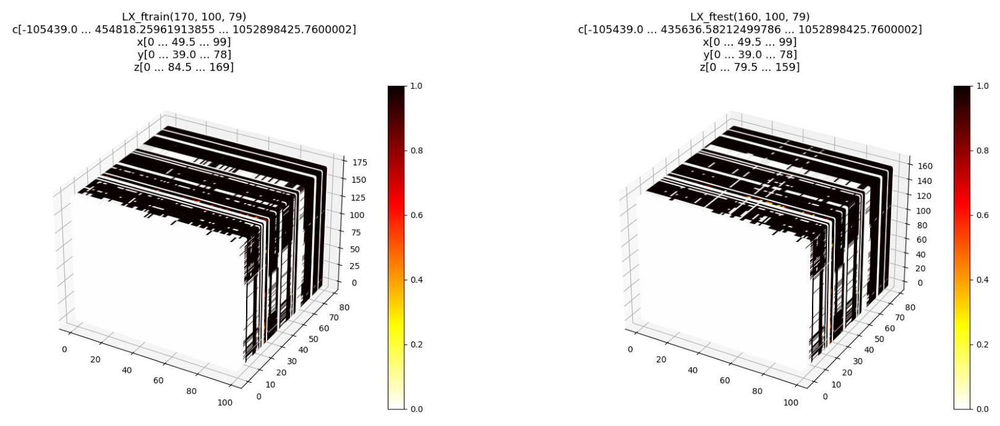

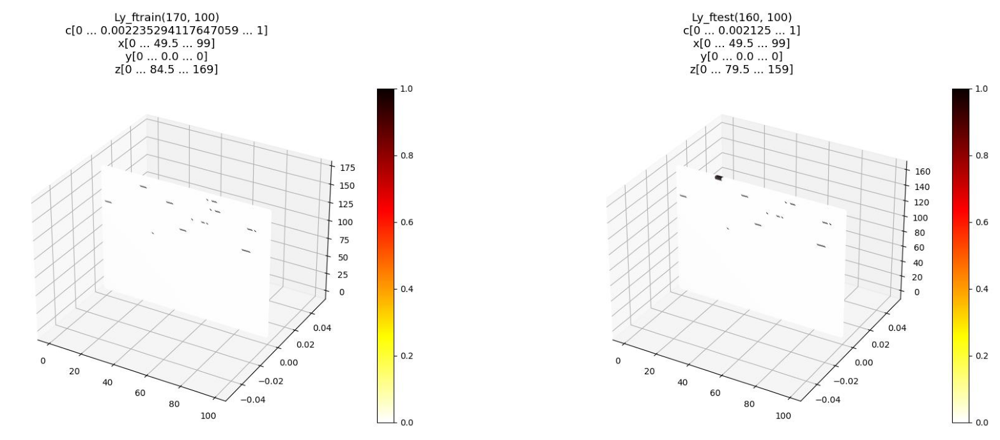

In [12]:
#@title overview featured vs normalized data IMG

show_4d_imgs(['LX_ftrain','LX_ftest'])
show_4d_imgs(['Ly_ftrain','Ly_ftest'])

# 4.INTRODUCTION

To create powerful models, especially for solving Seq2Seq learning problems, LSTM is the key layer.
To use LSTM effectively in models, we need to understand how it generates different results with respect to given parameters.

## 4.1.QUICK RECAP OF LSTM

### 4.1.1.Internal Structure

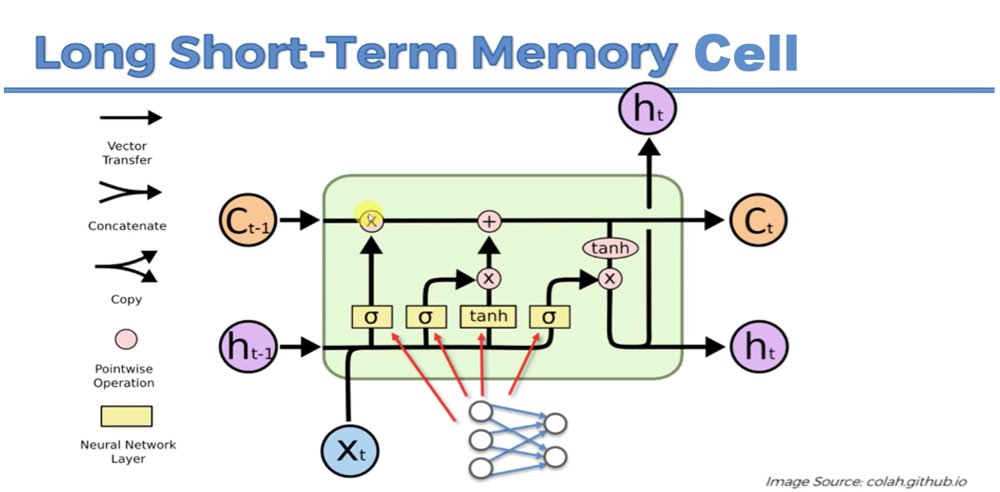

### 4.1.2.Roll-Out Representation of LSTM for each Time Step

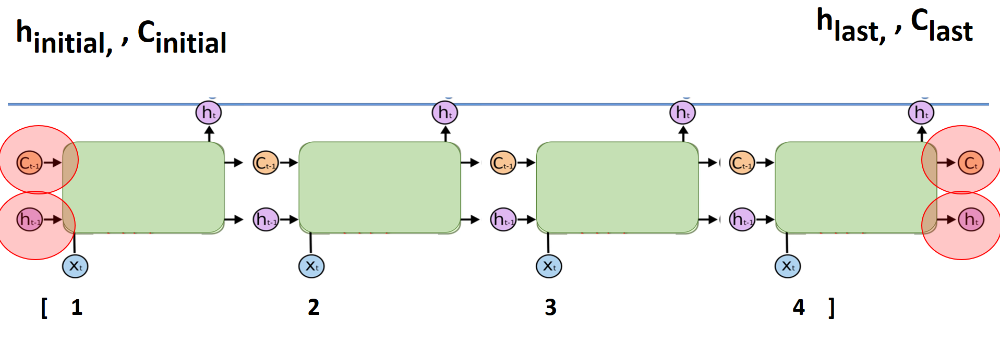

# 5.LSTM Anomaly State management

## 5.1.Model layers



In [13]:
def new_model5():
  num_outputs = 2
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.keras.activations.linear, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model5: Model = Model(
      inputs=
      [
        input_layer,
        #seq_in,
        state_in_h,
        state_in_c
      ],
      outputs=[logits, values, state_h, state_c])
  return model5

model5 = new_model5()
model5.summary()

h = np.zeros((train_size, cell_size), np.float32)
c = np.zeros((train_size, cell_size), np.float32)
IMG['h'], IMG['c'] = ray.get([
    show_scattered_4d.remote(h, "h"),
    show_scattered_4d.remote(c, "c"),
])

2023-01-27 14:48:22.354234: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13348 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:3f:00.0, compute capability: 8.6
2023-01-27 14:48:22.355033: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13348 MB memory:  -> device: 1, name: NVIDIA A16, pci bus id: 0000:40:00.0, compute capability: 8.6
2023-01-27 14:48:22.355805: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 13348 MB memory:  -> device: 2, name: NVIDIA A16, pci bus id: 0000:41:00.0, compute capability: 8.6
2023-01-27 14:48:22.356552: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:3 with 13348 MB memory:  -> device: 3, name: NVIDIA A16, pci bus id: 0000:42:00.0, compute capability: 8.6


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputs (InputLayer)            [(None, None, 79)]   0           []                               
                                                                                                  
 dense1 (Dense)                 (None, None, 230)    18400       ['inputs[0][0]']                 
                                                                                                  
 h (InputLayer)                 [(None, 320)]        0           []                               
                                                                                                  
 c (InputLayer)                 [(None, 320)]        0           []                               
                                                                                              

## 5.2.Train



In [14]:
#@title state function

def train_state(model, x=LX_ftrain, h=h, c=c, y=Ly_ftrain, title=['model5', 'LX_ftrain', 'h', 'c', 'Ly_ftrain']):
  compile = model.predict([x, h, c])
  IMG[f"{title[4]}_predicted"], IMG[f"{title[4]}_h"], IMG[f"{title[4]}_c"] = ray.get([
    show_scattered_4d.remote(compile[1], f"{title[4]}_predicted"),
    show_scattered_4d.remote(compile[2], f"{title[4]}_h"),
    show_scattered_4d.remote(compile[3], f"{title[4]}_c"),
  ])

  show_4d_imgs([title[1], title[4], f"{title[4]}_predicted"])
  show_4d_imgs([title[1], title[2], f"{title[4]}_h"])
  show_4d_imgs([title[1], title[3], f"{title[4]}_c"])

2023-01-27 14:48:27.378967: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-01-27 14:48:28.271018: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8204


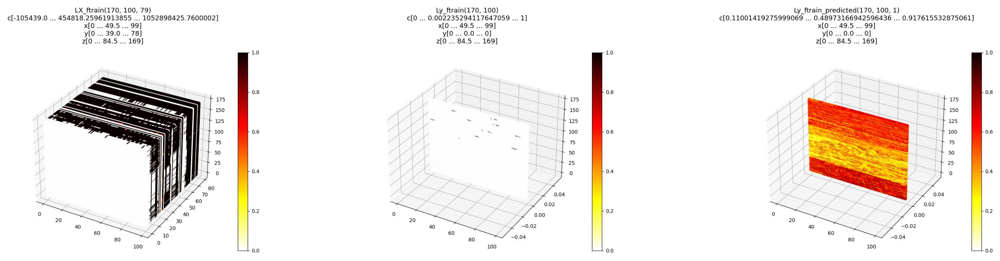

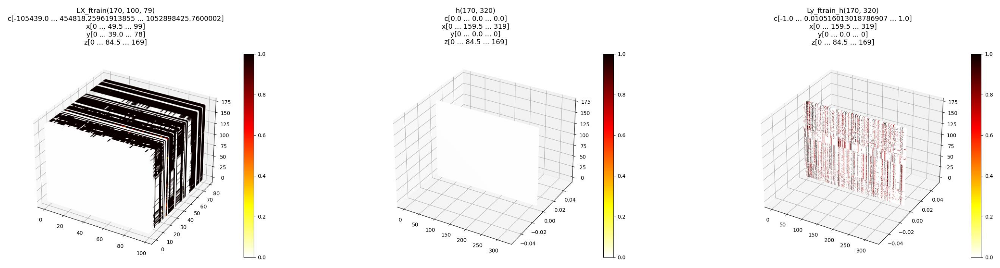

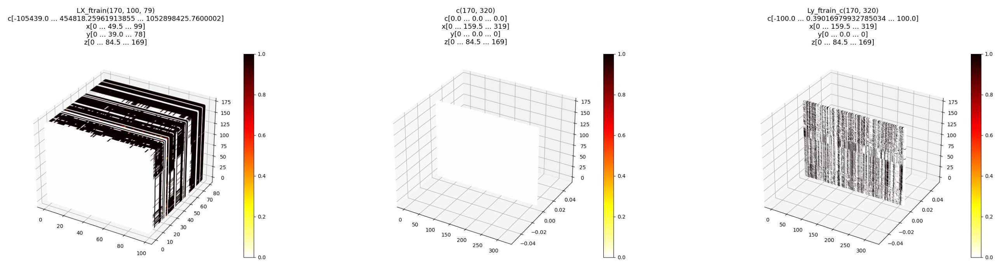

In [15]:
#@title train state

#model5.compile("adam", "binary_crossentropy", metrics=["accuracy"])
train_state(new_model5(), LX_ftrain, h, c, Ly_ftrain, ['model5', 'LX_ftrain', 'h', 'c', 'Ly_ftrain'])

In [16]:
#@title train function
def ftrain(model, name='model'):
  model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
  history = model.fit(LX_ftrain, Ly_ftrain, batch_size=batch_size, epochs=epochs, validation_data=(LX_ftest, Ly_ftest))
  show_train_metric(history, name)
  model.save(f"/usr/local/opnsense/scripts/ml/aicheckpoints/anomaly_flow79_local_ssh/{name}")
  open(f"/usr/local/opnsense/scripts/ml/aicheckpoints/anomaly_flow79_local_ssh/{name}/features.json", "w").write(json.dumps(features))

In [17]:
## 5.3.Infer

In [25]:
#@title infer function

def finfer(name='model', checkpoint='anomaly_flow79_local_ssh'):
  model = keras.models.load_model(f"/usr/local/opnsense/scripts/ml/aicheckpoints/{checkpoint}/{name}")
  ##############LX_ftrain
  L_fresult1=model.predict(LX_ftrain)
  ##############LX_ftest
  L_fresult2=model.predict(LX_ftest)

  IMG['Ly_ftrain_predicted'], IMG['Ly_ftest_predicted'] = ray.get([
    show_scattered_4d.remote(L_fresult1, "Ly_ftrain_predicted"),
    show_scattered_4d.remote(L_fresult2, "Ly_ftest_predicted"),
  ])
  show_4d_imgs(['LX_ftrain','Ly_ftrain','Ly_ftrain_predicted'])
  show_4d_imgs(['LX_ftest','Ly_ftest','Ly_ftest_predicted'])


___

# 6.LSTM Anomaly model (Primary)

## 6.1.Model layers



In [19]:
def new_model6():
  num_outputs = 10
  # Define input layers
  input_layer = tf.keras.layers.Input(shape=(None, n_features), name="inputs")
  #state_in_h = tf.keras.layers.Input(shape=(cell_size,), name="h")
  #state_in_c = tf.keras.layers.Input(shape=(cell_size,), name="c")
  #seq_in = tf.keras.layers.Input(shape=(), name="seq_in", dtype=tf.int32)

  # Preprocess observation with a hidden layer and send to LSTM cell
  #tf.nn.sigmoid
  dense1 = tf.keras.layers.Dense(hidden_size, activation=tf.nn.relu, name="dense1")(input_layer)
  lstm_out, state_h, state_c = tf.keras.layers.LSTM(
      cell_size, return_sequences=True, return_state=True, name="lstm")(
      inputs=dense1,
      #mask=tf.sequence_mask(seq_in),
      #initial_state=[state_in_h, state_in_c]
      )

  # Postprocess LSTM output with another hidden layer and compute values
  logits = tf.keras.layers.Dense(
      num_outputs,
      activation=tf.keras.activations.linear,
      name="logits")(lstm_out)
  values = tf.keras.layers.Dense(
      1, activation="sigmoid", name="values")(lstm_out)

  # Create the RNN model
  model6: Model = Model(
      inputs=input_layer,
      #[
      #  input_layer, #seq_in,
      #  state_in_h,
      #  state_in_c
      #],
      outputs=values
      #[
      #  logits,
      #  values,
      #  state_h,
      #  state_c
      #]
      )
  return model6

model6 = new_model6()
model6.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, None, 79)]        0         
                                                                 
 dense1 (Dense)              (None, None, 230)         18400     
                                                                 
 lstm (LSTM)                 [(None, None, 320),       705280    
                              (None, 320),                       
                              (None, 320)]                       
                                                                 
 values (Dense)              (None, None, 1)           321       
                                                                 
Total params: 724,001
Trainable params: 724,001
Non-trainable params: 0
_________________________________________________________________


## 6.2.Train



Epoch 1/100
6/6 [==============================] - 2s 113ms/step - loss: 0.2302 - accuracy: 0.9502 - val_loss: 0.0319 - val_accuracy: 0.9979
Epoch 2/100
6/6 [==============================] - 0s 27ms/step - loss: 0.0246 - accuracy: 0.9978 - val_loss: 0.0164 - val_accuracy: 0.9979
Epoch 3/100
6/6 [==============================] - 0s 27ms/step - loss: 0.0161 - accuracy: 0.9978 - val_loss: 0.0147 - val_accuracy: 0.9979
Epoch 4/100
6/6 [==============================] - 0s 26ms/step - loss: 0.0157 - accuracy: 0.9978 - val_loss: 0.0156 - val_accuracy: 0.9979
Epoch 5/100
6/6 [==============================] - 0s 27ms/step - loss: 0.0167 - accuracy: 0.9978 - val_loss: 0.0165 - val_accuracy: 0.9979
Epoch 6/100
6/6 [==============================] - 0s 28ms/step - loss: 0.0177 - accuracy: 0.9978 - val_loss: 0.0169 - val_accuracy: 0.9979
Epoch 7/100
6/6 [==============================] - 0s 27ms/step - loss: 0.0180 - accuracy: 0.9978 - val_loss: 0.0175 - val_accuracy: 0.9979
Epoch 8/100
6/6 [==

2023-01-27 14:48:52.915315: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


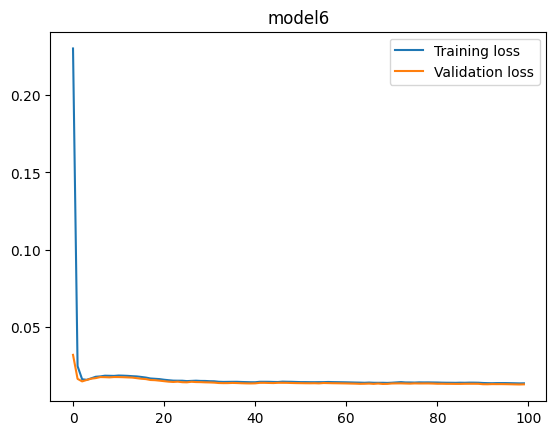

In [20]:
ftrain(model6, 'model6')

## 6.3.Infer



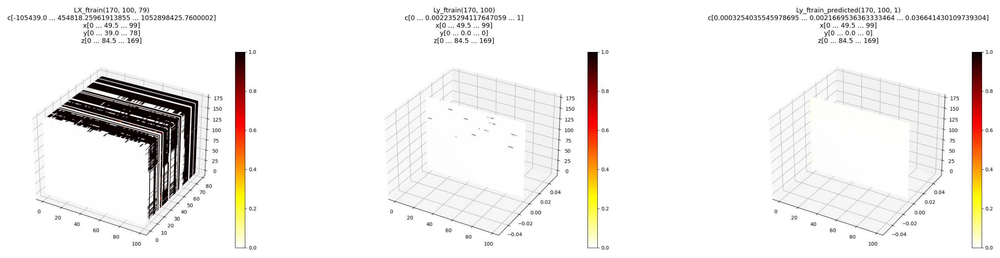

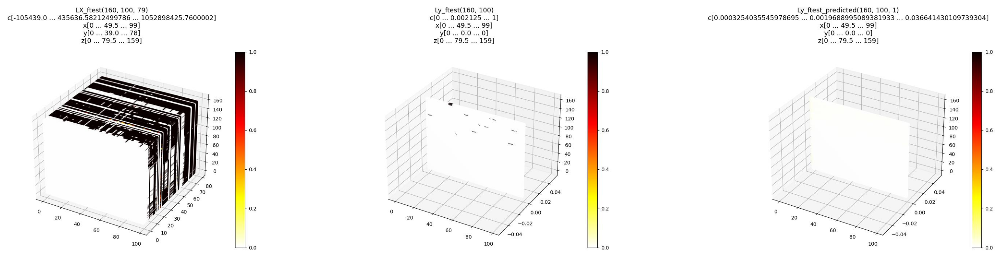

In [26]:
finfer('model6')

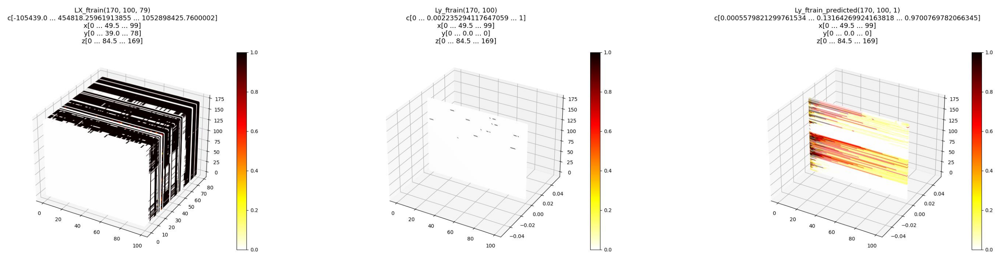

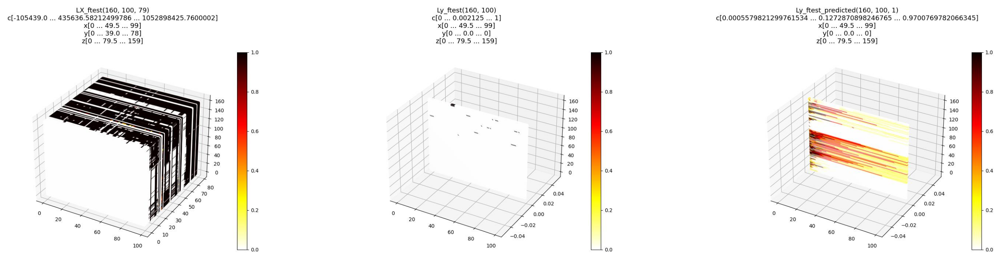

In [27]:
finfer('model6', 'anomaly_flow79_cic_ssh')

# 7.MODEL WEIGHTS SUMMARY

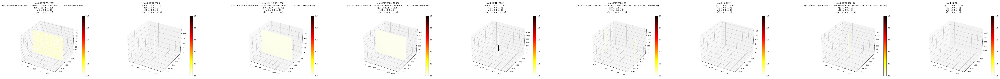

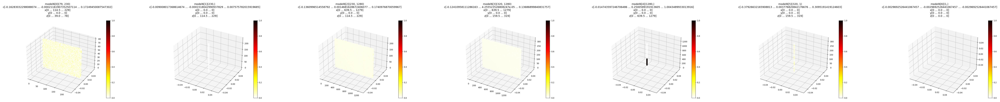

In [22]:
weights5 = show_weights(model5, 'model5')
weights6 = show_weights(model6, 'model6')

show_4d_imgs(weights5)
show_4d_imgs(weights6)